[(0.9055901576316802, 0.8817377931564783, 0.9369319492502883), (0.8310342176086121, 0.7243521722414455, 0.854317570165321), (0.7892502883506344, 0.5782237600922723, 0.7793310265282584), (0.8750019223375625, 0.3923875432525951, 0.6878585159554017), (0.9039600153787005, 0.1590157631680123, 0.5371780084582852), (0.8028604382929643, 0.0689273356401384, 0.33550173010380624), (0.590803537101115, 0.0, 0.2588696655132641)]


<Figure size 1500x1000 with 0 Axes>

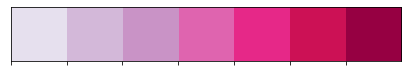

In [2]:
%matplotlib inline

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageFont, ImageDraw, ImageEnhance
from matplotlib.patches import Circle
from pylab import *
import glob
import os
from readimage import image_read
from coord_io import read_star_file
import seaborn as sns

# plt.figure(dpi=250)
# sns.set_palette("PuRd",7)
# sns.palplot(sns.color_palette())
# print(sns.color_palette())#返回默认颜色元组组成的list
# colors = sns.color_palette()

In [ ]:
%%bash
mkdir -p /data/zhangchi/cryodata/empiar10406/compare_software/cryolo_results
mkdir -p /data/zhangchi/cryodata/empiar10406/compare_software/relion_results
mkdir -p /data/zhangchi/cryodata/empiar10406/compare_software/topaz_results
mkdir -p /data/zhangchi/cryodata/empiar10406/compare_software/transpicker_results

In [ ]:
ls /data/zhangchi/cryodata/empiar10406/annots

## empiar10406结果对比

In [ ]:
def display_compare(name):
    root_path = "/data/zhangchi/cryodata/empiar10406"
    img_path = f"{root_path}/denoised/{name}.mrc"
    relion_path = f"{root_path}/compare_software/relion_results/{name}_autopick.star"
    cryolo_path = f"{root_path}/compare_software/cryolo_results/{name}.star"
    topaz_default_path = f"{root_path}/compare_software/topaz_results/10406_topaz_defaults/{name}.star"
    topaz_train_path = f"{root_path}/compare_software/topaz_results/10406_topaz_train/{name}.star"
    transpicker_path = f"/data/zhangchi/transpicker_outputs/my_outputs_10406_denoised/step_star_compare/{name}.star"
    gt_path = f"{root_path}/annots/{name}.star"

    boxsize=200

    boxes_gt = read_star_file(gt_path, boxsize)
    boxes_cryolo = read_star_file(cryolo_path, boxsize)
    boxes_relion = read_star_file(relion_path, boxsize)
    boxes_topaz_default = read_star_file(topaz_default_path, boxsize)
    boxes_topaz_train = read_star_file(topaz_train_path, boxsize)
    boxes_transpicker = read_star_file(transpicker_path, boxsize)

    # display
    f,ax = plt.subplots(2,3,figsize=(30,20))
    plt.subplots_adjust(left=0.15,bottom=0.1,top=0.9,right=0.9,hspace=0.05, wspace=0.05)
    # f.suptitle(f"empiar-10406", x=0.5, y=0, fontsize=35, fontname="Times New Roman",fontweight="bold")


    source_img = np.array(image_read(img_path), copy=False)
    source_img = np.flip(source_img, 0)
    mean = np.mean(source_img)
    sd = np.std(source_img)
    image_norm = (source_img - mean) / sd
    im_h, im_w = image_norm.shape
    radius=100

    ax[0][0].imshow(image_norm, origin="lower", cmap='gray', vmin=-3, vmax=3, interpolation='bilinear')
    ax[0][0].set_title("GT",y=1, fontsize=25,fontweight="bold")
    ax[0][0].axis('off')
    for box in boxes_gt:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[1])
        ax[0][0].add_patch(c)

    ax[0][1].imshow(image_norm, origin="lower", cmap='gray', vmin=-3, vmax=3, interpolation='bilinear')
    ax[0][1].set_title("RELION",y=1, fontsize=25,fontweight="bold")
    ax[0][1].axis('off')
    for box in boxes_relion:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[2])
        ax[0][1].add_patch(c)

    ax[0][2].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[0][2].set_title("CrYOLO", y=1,fontsize=25,fontweight="bold")
    ax[0][2].axis('off')
    for box in boxes_cryolo:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[3])
        ax[0][2].add_patch(c)

    ax[1][0].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[1][0].set_title("Topaz(general)", y=1,fontsize=25,fontweight="bold")
    ax[1][0].axis('off')
    for box in boxes_topaz_default:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5,color=colors[4])
        ax[1][0].add_patch(c)

    ax[1][1].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[1][1].set_title("Topaz", y=1,fontsize=25,fontweight="bold")
    ax[1][1].axis('off')
    for box in boxes_topaz_train:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5,color=colors[5])
        ax[1][1].add_patch(c)
    
    ax[1][2].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[1][2].set_title("TransPicker", y=1,fontsize=25,fontweight="bold")
    ax[1][2].axis('off')
    for box in boxes_transpicker:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5,color=colors[6])
        ax[1][2].add_patch(c)
    # for box in boxes_gt:
    #     c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[1],alpha=0.6)
    #     ax[1][2].add_patch(c)

    # plt.savefig("/data/zhangchi/cryodata/empiar10406/software_compare/empiar10406_compare_example.svg")

colors = ['red','aqua','red','red','red','red','red','deeppink']
display_compare('FoilHole_3164986_Data_3165659_3165660_20190104_1200-60865')

# display('549')

In [ ]:
%%bash

# ls /data/zhangchi/transpicker_outputs/my_outputs_10406_denoised/step_star_compare/
ls /data/zhangchi/cryodata/empiar10406/compare_software/topaz_results

## empiar10028结果对比：


In [ ]:
%%bash
mkdir -p /data/zhangchi/cryodata/empiar10590/compare_software/cryolo_results
mkdir -p /data/zhangchi/cryodata/empiar10590/compare_software/relion_results
mkdir -p /data/zhangchi/cryodata/empiar10590/compare_software/topaz_results
mkdir -p /data/zhangchi/cryodata/empiar10590/compare_software/transpicker_results

In [24]:
ls /data/zhangchi/cryodata/empiar10028/compare_results/topaz_general/star_file/


m066.star*  m154.star*  m406.star*  m436.star*  m512.star*  m549.star*
m088.star*  m161.star*  m408.star*  m437.star*  m515.star*  m579.star*
m102.star*  m164.star*  m409.star*  m438.star*  m519.star*  m580.star*
m112.star*  m165.star*  m415.star*  m445.star*  m522.star*  m587.star*
m127.star*  m179.star*  m421.star*  m449.star*  m533.star*
m134.star*  m186.star*  m422.star*  m453.star*  m534.star*
m135.star*  m200.star*  m423.star*  m454.star*  m536.star*
m145.star*  m400.star*  m424.star*  m457.star*  m541.star*
m153.star*  m405.star*  m428.star*  m459.star*  m544.star*


/data/zhangchi/cryodata/empiar10028/denoised/066.mrc


/home/zhangchi/anaconda3/envs/deformable_detr/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:209: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/home/zhangchi/anaconda3/envs/deformable_detr/lib/python3.7/site-packages/mrcfile/mrcinterpreter.py:219: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)


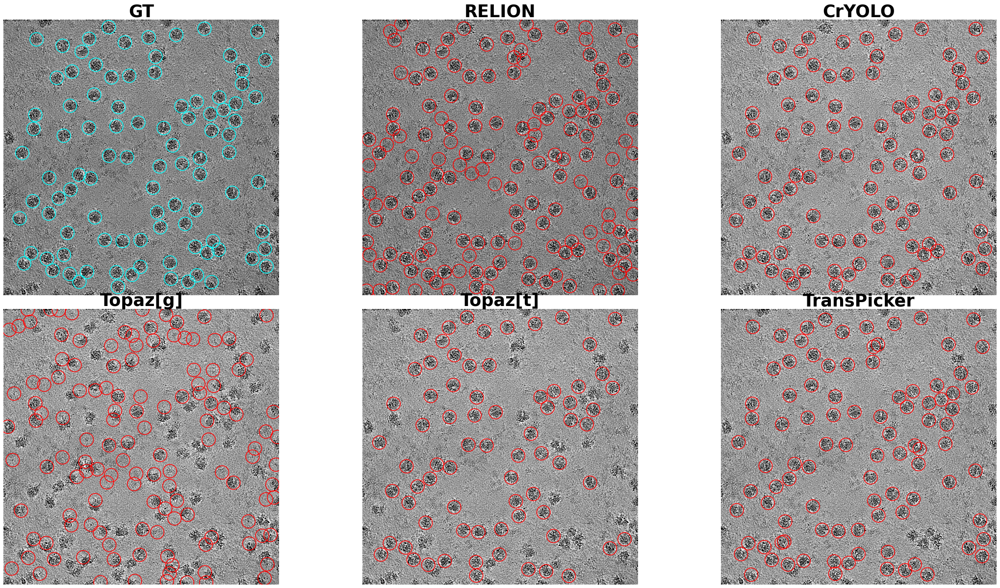

In [3]:
def display_compare(name):
    root_path = "/data/zhangchi/cryodata/empiar10028"
    img_path = f"{root_path}/denoised/{name[1:]}.mrc"
    relion_path = f"{root_path}/compare_results/relion/autopick/{name}_autopick.star"
    cryolo_path = f"{root_path}/compare_results/cryolo_general/STAR/{name}.star"
    topaz_default_path = f"{root_path}/compare_results/topaz_general/star_file/{name}.star"
    topaz_train_path = f"{root_path}/compare_results/topaz_train/star_file/{name}.star"
    transpicker_path = f"/data/zhangchi/transpicker_outputs/my_outputs_10028_denoised_ciou/step_star_compare/{name[1:]}.star"
    gt_path = f"{root_path}/annots/{name[1:]}.star"

    boxsize=227

    boxes_gt = read_star_file(gt_path, boxsize)
    boxes_cryolo = read_star_file(cryolo_path, boxsize)
    boxes_relion = read_star_file(relion_path, boxsize)
    boxes_topaz_default = read_star_file(topaz_default_path, boxsize)
    boxes_topaz_train = read_star_file(topaz_train_path, boxsize)
    boxes_transpicker = read_star_file(transpicker_path, boxsize)

    # display
    f,ax = plt.subplots(2,3,figsize=(30,20))
    plt.subplots_adjust(left=0.15,bottom=0.1,top=0.9,right=0.9,hspace=0.05, wspace=0.05)
    # f.suptitle(f"empiar-10406", x=0.5, y=0, fontsize=35, fontname="Times New Roman",fontweight="bold")


    source_img = np.array(image_read(img_path), copy=False)
    source_img = np.flip(source_img, 0)
    mean = np.mean(source_img)
    sd = np.std(source_img)
    image_norm = (source_img - mean) / sd
    im_h, im_w = image_norm.shape
    radius=100

    ax[0][0].imshow(image_norm, origin="lower", cmap='gray', vmin=-3, vmax=3, interpolation='bilinear')
    ax[0][0].set_title("GT",y=1, fontsize=35,fontweight="bold")
    ax[0][0].axis('off')
    for box in boxes_gt:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[1])
        ax[0][0].add_patch(c)

    ax[0][1].imshow(image_norm, origin="lower", cmap='gray', vmin=-3, vmax=3, interpolation='bilinear')
    ax[0][1].set_title("RELION",y=1, fontsize=35,fontweight="bold")
    ax[0][1].axis('off')
    for box in boxes_relion:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[2])
        ax[0][1].add_patch(c)

    ax[0][2].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[0][2].set_title("CrYOLO", y=1,fontsize=35,fontweight="bold")
    ax[0][2].axis('off')
    for box in boxes_cryolo:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5, color=colors[3])
        ax[0][2].add_patch(c)

    ax[1][0].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[1][0].set_title("Topaz[g]", y=1,fontsize=35,fontweight="bold")
    ax[1][0].axis('off')
    for box in boxes_topaz_default:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5,color=colors[4])
        ax[1][0].add_patch(c)

    ax[1][1].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[1][1].set_title("Topaz[t]", y=1,fontsize=35,fontweight="bold")
    ax[1][1].axis('off')
    for box in boxes_topaz_train:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5,color=colors[5])
        ax[1][1].add_patch(c)
    
    ax[1][2].imshow(image_norm, origin="lower", cmap='Greys_r', vmin=-3, vmax=3, interpolation='bilinear')
    ax[1][2].set_title("TransPicker", y=1,fontsize=35,fontweight="bold")
    ax[1][2].axis('off')
    for box in boxes_transpicker:
        c = Circle((box.x+boxsize/2, box.y+boxsize/2),radius,fill=False,linewidth=1.5,color=colors[6])
        ax[1][2].add_patch(c)
    # plt.savefig("/data/zhangchi/cryodata/empiar10406/software_compare/empiar10406_compare_example.svg")

colors = ['red','aqua','red','red','red','red','red','deeppink']
display_compare('m066')

# display('m549')

In [7]:
%%bash
ls /data/zhangchi/cryodata/empiar10028/compare_results/topaz_general/star_file/

m066.star
m088.star
m102.star
m112.star
m127.star
m134.star
m135.star
m145.star
m153.star
m154.star
m161.star
m164.star
m165.star
m179.star
m186.star
m200.star
m400.star
m405.star
m406.star
m408.star
m409.star
m415.star
m421.star
m422.star
m423.star
m424.star
m428.star
m436.star
m437.star
m438.star
m445.star
m449.star
m453.star
m454.star
m457.star
m459.star
m512.star
m515.star
m519.star
m522.star
m533.star
m534.star
m536.star
m541.star
m544.star
m549.star
m579.star
m580.star
m587.star


/data/zhangchi/cryodata/empiar10028/denoised/587.mrc


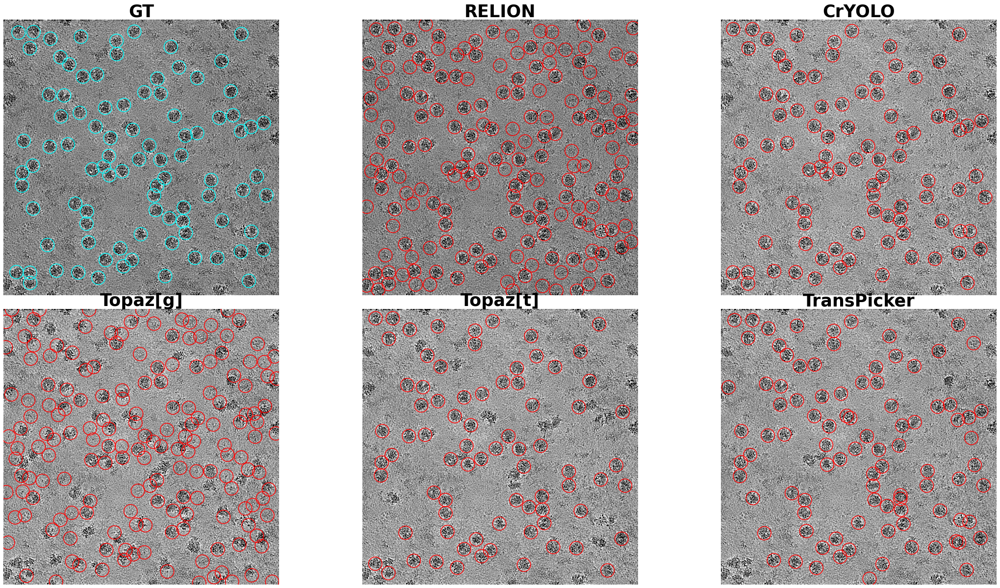

In [4]:
display_compare('m587')

In [ ]:
# empiar10093
%matplotlib inline

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageFont, ImageDraw, ImageEnhance
from matplotlib.patches import Circle
from pylab import *
import glob
import os
from readimage import image_read
from coord_io import read_star_file
import seaborn as sns